In [1]:
from dotenv import load_dotenv, find_dotenv
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import pandas as pd
import numpy as np
import os
import sys
import json
import random
from PIL import Image
import cv2

sys.path.append(str(Path(os.getcwd()).parent.parent))

from src.eeg_science_direct_sql_db.querying import EEGScienceDirectSQLDBQueryier

load_dotenv(find_dotenv())

True

In [2]:
LOSS_FOLDER = Path(os.getenv("OUTPUT_FOLDER")) / "losses"
FINETUNING = False
RESULT_FOLDER = Path(os.getenv("OUTPUT_FOLDER")) / "experiment_results"



In [3]:
def read_experiment_results(experiment: str='e1', subject: int=1):
    experiment_results = {}
    for file in os.listdir(RESULT_FOLDER / f'finetuning_s{subject}'):
        if file.endswith(".json") and file.split('_')[2] == experiment:
            index = 5 if subject == 1 else 6
            with open(RESULT_FOLDER / f'finetuning_s{subject}' / file) as f:
                model = file.split('_')[index]
                if model == 'Benchmark':
                    model = 'TsConv'
                experiment_results[model] = json.load(f)
    return experiment_results

## Overall Classes

#### Overall Resuls

/tmp/ipykernel_7641/3138121435.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mean_df['Metric'] = mean_df['Metric'].str.replace('mean_', '')
/tmp/ipykernel_7641/3138121435.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sd_df['Metric'] = sd_df['Metric'].str.replace('sd_', '')


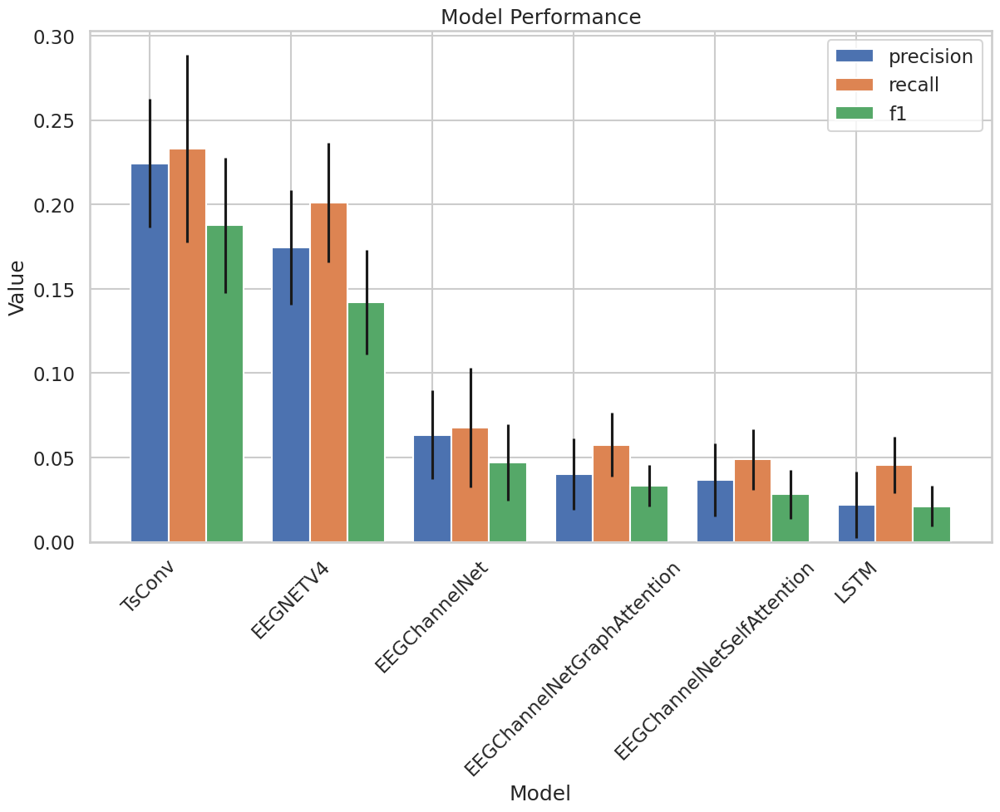

In [4]:
subject_results = [read_experiment_results(f'e1', subject=i) for i in range(1, 11)]

result_formated = {}
for i, subject_result in enumerate(subject_results):
    for key, classes_result in subject_result.items():
        if i == 0:
            result_formated[key] = {
                'mean_precision': [],
                'mean_recall': [],
                'mean_f1': [],
            }
        result_formated[key]['mean_precision'].append(np.mean([val['precision'] for key, val in classes_result.items()]))
        result_formated[key]['mean_recall'].append(np.mean([val['recall'] for key, val in classes_result.items()]))
        result_formated[key]['mean_f1'].append(np.mean([val['f1'] for key, val in classes_result.items()]))

for key, val in result_formated.items():
    result_formated[key]['sd_precision'] = np.std(val['mean_precision'])
    result_formated[key]['mean_precision'] = np.mean(val['mean_precision'])
    result_formated[key]['sd_recall'] = np.std(val['mean_recall'])
    result_formated[key]['mean_recall'] = np.mean(val['mean_recall'])
    result_formated[key]['sd_f1'] = np.std(val['mean_f1'])
    result_formated[key]['mean_f1'] = np.mean(val['mean_f1'])
    

overall_result_df = pd.DataFrame(result_formated).T
overall_result_df['Model'] = overall_result_df.index
overall_result_df = overall_result_df.sort_values(by='mean_precision', ascending=False)
overall_result_df = overall_result_df.melt(id_vars='Model', var_name='Metric', value_name='Value')

# Separate means and standard deviations
mean_df = overall_result_df[overall_result_df['Metric'].str.contains('mean')]
mean_df['Metric'] = mean_df['Metric'].str.replace('mean_', '')
sd_df = overall_result_df[overall_result_df['Metric'].str.contains('sd')]
sd_df['Metric'] = sd_df['Metric'].str.replace('sd_', '')

# Merge means and standard deviations
final_df = pd.merge(mean_df, sd_df, on=['Model', 'Metric'])
final_df.columns = ['Model', 'Metric', 'Mean Value', 'SD Value']

# Create the barplot with error bars
sns.set(style="whitegrid", context="talk")
plt.figure(figsize=(14, 8))

# Get the number of models and metrics
num_models = final_df['Model'].nunique()
num_metrics = final_df['Metric'].nunique()

# Create an array for the x-axis locations
x = np.arange(num_models)

# Width of the bars
width = 0.8 / num_metrics

# For each metric, create a bar plot with error bars
for i, metric in enumerate(final_df['Metric'].unique()):
    # Filter the DataFrame for the current metric
    df = final_df[final_df['Metric'] == metric]
    
    # Create the bar plot with error bars
    plt.bar(x + i * width, df['Mean Value'], width, yerr=df['SD Value'], label=metric)

# Add labels, title, and legend
plt.xlabel('Model')
plt.ylabel('Value')
plt.title('Model Performance')
plt.xticks(x, final_df['Model'].unique())
plt.xticks(rotation=45)
plt.legend()

# Show the plot
plt.show()



#### Class F1-Score Results

/tmp/ipykernel_7641/436296887.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mean_df['Metric'] = mean_df['Metric'].str.replace('_mean', '')
/tmp/ipykernel_7641/436296887.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sd_df['Metric'] = sd_df['Metric'].str.replace('_sd', '')


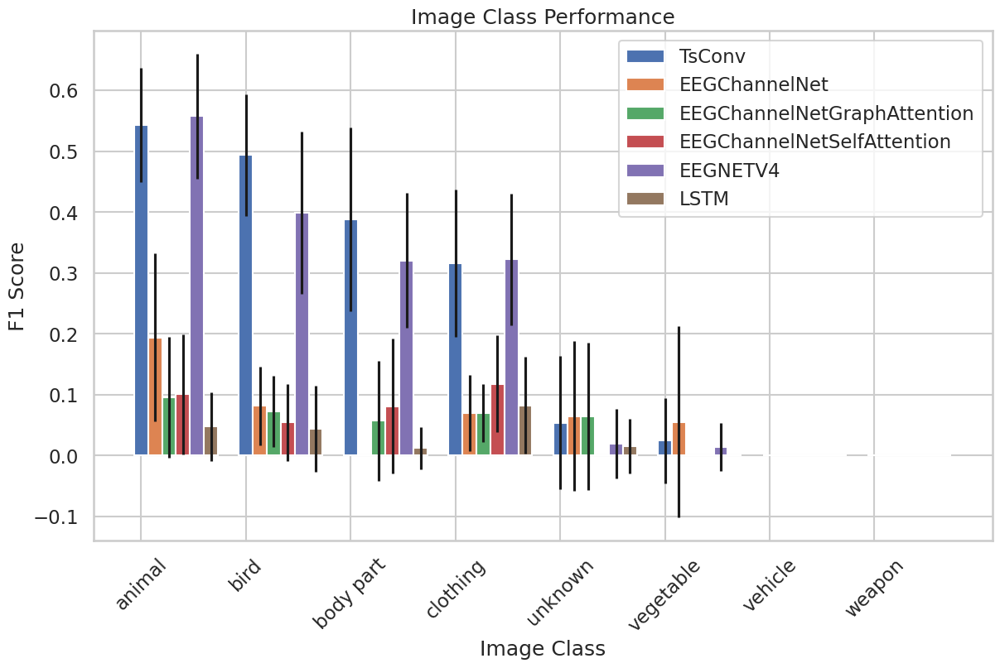

In [5]:
subject_results = [read_experiment_results(f'e1', subject=i) for i in range(1, 10)]

result_formated = {}
for i, subject_result in enumerate(subject_results):
    for key, classes_res in subject_result.items():
        if key not in result_formated:
            result_formated[key] = {}
        for class_key, class_result in classes_res.items():
            f1_score = 2 * (class_result['precision'] * class_result['recall']) / (class_result['precision'] + class_result['recall']) if (class_result['precision'] + class_result['recall']) > 0 else 0
            if class_key not in result_formated[key]:
                result_formated[key][class_key] = []
            result_formated[key][class_key].append(f1_score)

result_formated_out = {}
for key, val in result_formated.items():
    for class_key, class_val in val.items():
        if class_key not in result_formated_out:
            result_formated_out[class_key] = {}
        result_formated_out[class_key][key + "_mean"] = np.mean(class_val)
        result_formated_out[class_key][key + "_sd"] = np.std(class_val)


overall_result_df = pd.DataFrame(result_formated_out).T
overall_result_df['Image Class'] = overall_result_df.index
overall_result_df = overall_result_df.sort_values(by='Image Class')
overall_result_df = overall_result_df.melt(id_vars='Image Class', var_name='Metric', value_name='Value')

# Separate means and standard deviations
mean_df = overall_result_df[overall_result_df['Metric'].str.contains('mean')]
mean_df['Metric'] = mean_df['Metric'].str.replace('_mean', '')
sd_df = overall_result_df[overall_result_df['Metric'].str.contains('sd')]
sd_df['Metric'] = sd_df['Metric'].str.replace('_sd', '')

# Merge means and standard deviations
final_df = pd.merge(mean_df, sd_df, on=['Image Class', 'Metric'])
final_df.columns = ['Image Class', 'Metric', 'Mean Value', 'SD Value']

# Create the barplot with error bars
sns.set(style="whitegrid", context="talk")
plt.figure(figsize=(14, 8))

# Get the number of models and metrics
num_classes = final_df['Image Class'].nunique()
num_metrics = final_df['Metric'].nunique()

# Create an array for the x-axis locations
IMG_IDXS = np.array([0, 1, 2, 3, 21, 22, 23, 24])
x = np.arange(len(IMG_IDXS))

img_classes_selected = final_df[final_df['Metric'] == 'TsConv'].sort_values(by='Mean Value', ascending=False)['Image Class'].values[IMG_IDXS]

# Width of the bars
width = 0.8 / num_metrics

# For each metric, create a bar plot with error bars
for i, metric in enumerate(final_df['Metric'].unique()):
    # Filter the DataFrame for the current metric
    df = final_df[final_df['Metric'] == metric]
    df = df[df['Image Class'].isin(img_classes_selected)]

    df = df.sort_values(by='Image Class', key=lambda x: [list(img_classes_selected).index(i) for i in x])

    
    # Create the bar plot with error bars
    plt.bar(x + i * width, df['Mean Value'], width, yerr=df['SD Value'], label=metric)

# Add labels, title, and legend
plt.xlabel('Image Class')
plt.ylabel('F1 Score')
plt.title('Image Class Performance')
plt.xticks(x, final_df['Image Class'].unique()[IMG_IDXS])
plt.xticks(rotation=45)
plt.legend()

# Show the plot
plt.show()


In [6]:
subject_results = [read_experiment_results(f'e1', subject=i) for i in range(1, 11)]
result_formated = {}
for i, subject_result in enumerate(subject_results):
    class_results = subject_result["TsConv"]
    for class_key, class_result in class_results.items():
        f1_score = 2 * (class_result['precision'] * class_result['recall']) / (class_result['precision'] + class_result['recall']) if (class_result['precision'] + class_result['recall']) > 0 else 0
        if class_key not in result_formated:
            result_formated[class_key] = []
        result_formated[class_key].append(f1_score)

class_subject_df = pd.DataFrame(result_formated).T
class_subject_df.columns = [f"Subject {i}" for i in range(1, 11)]
class_subject_df["Mean F1-Score"] = class_subject_df.mean(axis=1)
class_subject_df["Std Dev F1-Score"] = class_subject_df.std(axis=1)
class_subject_df = class_subject_df.sort_values(by='Mean F1-Score', ascending=False)
class_subject_df 

,Subject 1,Subject 2,Subject 3,Subject 4,Subject 5,Subject 6,Subject 7,Subject 8,Subject 9,Subject 10,Mean F1-Score,Std Dev F1-Score
animal,0.523810,0.562500,0.400000,0.717949,0.428571,0.562500,0.642857,0.564103,0.482759,0.518519,0.540357,0.089361
clothing,0.454545,0.347826,0.666667,0.600000,0.454545,0.470588,0.421053,0.608696,0.421053,0.562500,0.500747,0.097012
insect,0.250000,0.222222,0.142857,0.421053,0.666667,0.500000,0.400000,0.461538,0.428571,0.285714,0.377862,0.146474
vehicle,0.294118,0.173913,0.529412,0.444444,0.312500,0.357143,0.214286,0.384615,0.137931,0.400000,0.324836,0.117240
vegetable,0.222222,0.200000,0.500000,0.260870,0.100000,0.250000,0.416667,0.303030,0.166667,0.315789,0.273524,0.111677
fruit,0.177778,0.285714,0.200000,0.243902,0.160000,0.222222,0.333333,0.588235,0.148148,0.232558,0.259189,0.122099
furniture,0.250000,0.555556,0.000000,0.285714,0.307692,0.363636,0.235294,0.200000,0.000000,0.375000,0.257289,0.159277
tool,0.222222,0.256410,0.200000,0.312500,0.090909,0.285714,0.060606,0.357143,0.260870,0.303030,0.234940,0.090452
bird,0.200000,0.125000,0.266667,0.000000,0.153846,0.235294,0.250000,0.266667,0.518519,0.166667,0.218266,0.126340
food,0.139535,0.150943,0.181818,0.048780,0.133333,0.177778,0.346154,0.431373,0.120000,0.346154,0.207587,0.116738


## Classification Concepts

/tmp/ipykernel_7641/4177348966.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mean_df['Metric'] = mean_df['Metric'].str.replace('mean_', '')
/tmp/ipykernel_7641/4177348966.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sd_df['Metric'] = sd_df['Metric'].str.replace('sd_', '')


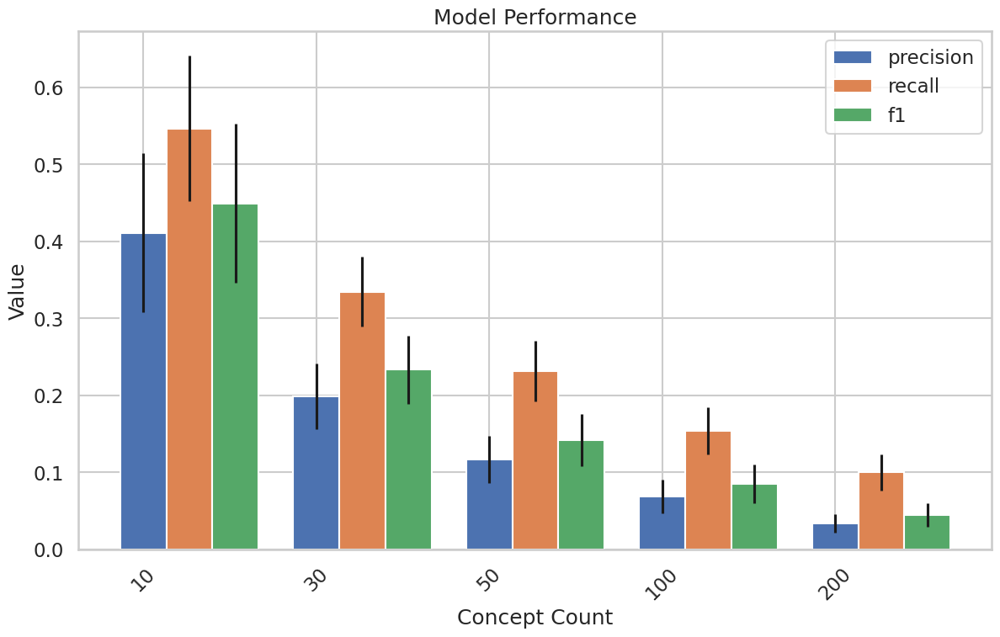

In [7]:
MODEL = "TsConv"
formated_results_df = {}

subject_results = [read_experiment_results('e2', subject=i)[MODEL] for i in range(1, 11)]
for i, subject_result in enumerate(subject_results):
    for val in subject_result['results']:

        if val['concept_count'] not in formated_results_df:
            formated_results_df[val['concept_count']] = {
                'precision': [],
                'recall': [],
                'f1_score': [],
            }

        formated_results_df[val['concept_count']]['precision'].append(np.mean([val['mean_precision'] for val in val['results']]))
        formated_results_df[val['concept_count']]['recall'].append(np.mean([val['mean_recall'] for val in val['results']]))
        formated_results_df[val['concept_count']]['f1_score'].append(np.mean([val['mean_f1'] for val in val['results']]))

for key, val in formated_results_df.items():
    formated_results_df[key]['mean_precision'] = np.mean(val['precision'])
    formated_results_df[key]['sd_precision'] = np.std(val['precision'])
    formated_results_df[key]['mean_recall'] = np.mean(val['recall'])
    formated_results_df[key]['sd_recall'] = np.std(val['recall'])
    formated_results_df[key]['mean_f1'] = np.mean(val['f1_score'])
    formated_results_df[key]['sd_f1'] = np.std(val['f1_score'])


overall_result_df = pd.DataFrame(formated_results_df).T
overall_result_df['Concept Count'] = overall_result_df.index
overall_result_df = overall_result_df.sort_values(by='Concept Count')
overall_result_df = overall_result_df.melt(id_vars='Concept Count', var_name='Metric', value_name='Value')

# Separate means and standard deviations
mean_df = overall_result_df[overall_result_df['Metric'].str.contains('mean')]
mean_df['Metric'] = mean_df['Metric'].str.replace('mean_', '')
sd_df = overall_result_df[overall_result_df['Metric'].str.contains('sd')]
sd_df['Metric'] = sd_df['Metric'].str.replace('sd_', '')

# Merge means and standard deviations
final_df = pd.merge(mean_df, sd_df, on=['Concept Count', 'Metric'])
final_df.columns = ['Concept Count', 'Metric', 'Mean Value', 'SD Value']

# Create the barplot with error bars
sns.set(style="whitegrid", context="talk")
plt.figure(figsize=(14, 8))

# Get the number of models and metrics
num_models = final_df['Concept Count'].nunique()
num_metrics = final_df['Metric'].nunique()

# Create an array for the x-axis locations
x = np.arange(num_models)

# Width of the bars
width = 0.8 / num_metrics

# For each metric, create a bar plot with error bars
for i, metric in enumerate(final_df['Metric'].unique()):
    # Filter the DataFrame for the current metric
    df = final_df[final_df['Metric'] == metric]
    
    # Create the bar plot with error bars
    plt.bar(x + i * width, df['Mean Value'], width, yerr=df['SD Value'], label=metric)

# Add labels, title, and legend
plt.xlabel('Concept Count')
plt.ylabel('Value')
plt.title('Model Performance')
plt.xticks(x, final_df['Concept Count'].unique())
plt.xticks(rotation=45)
plt.legend()

# Show the plot

plt.show()

## Object Width, Height, Position, Foregroundcolor, Backgroundcolor

In [8]:
MODELS = ["TsConv", "EEGNETV4", "EEGChannelNetSelfAttention", "EEGChannelNet", "EEGChannelNetGraphAttention", "LSTM"]
subject_results = []
num_of_classes = {
        'backgroundcolor': 3,
        'foregroundcolor': 3,
        'height': 3,
        'width': 3,
        'position': 9
    }

for i in range(1, 11):
    model_results = {}

    for model in MODELS:
        results = {}
        results['backgroundcolor'] = read_experiment_results('e3', subject=i)[model]
        results['foregroundcolor'] = read_experiment_results('e4', subject=i)[model]
        results['height'] = read_experiment_results('e5', subject=i)[model]
        results['width'] = read_experiment_results('e6', subject=i)[model]
        results['position'] = read_experiment_results('e7', subject=i)[model]
        model_results[model] = results

    
    model_results["Random Guess"] = {
        'backgroundcolor': {'mean_precision': 1 / num_of_classes['backgroundcolor']},
        'foregroundcolor': {'mean_precision': 1 / num_of_classes['foregroundcolor']},
        'height': {'mean_precision': 1 / num_of_classes['height']},
        'width': {'mean_precision': 1 / num_of_classes['width']},
        'position': {'mean_precision': 1 / num_of_classes['position']}
    }

    subject_results.append(model_results)

/tmp/ipykernel_7641/1651498409.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mean_df['Metric'] = mean_df['Metric'].str.replace('mean_', '')
/tmp/ipykernel_7641/1651498409.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sd_df['Metric'] = sd_df['Metric'].str.replace('sd_', '')


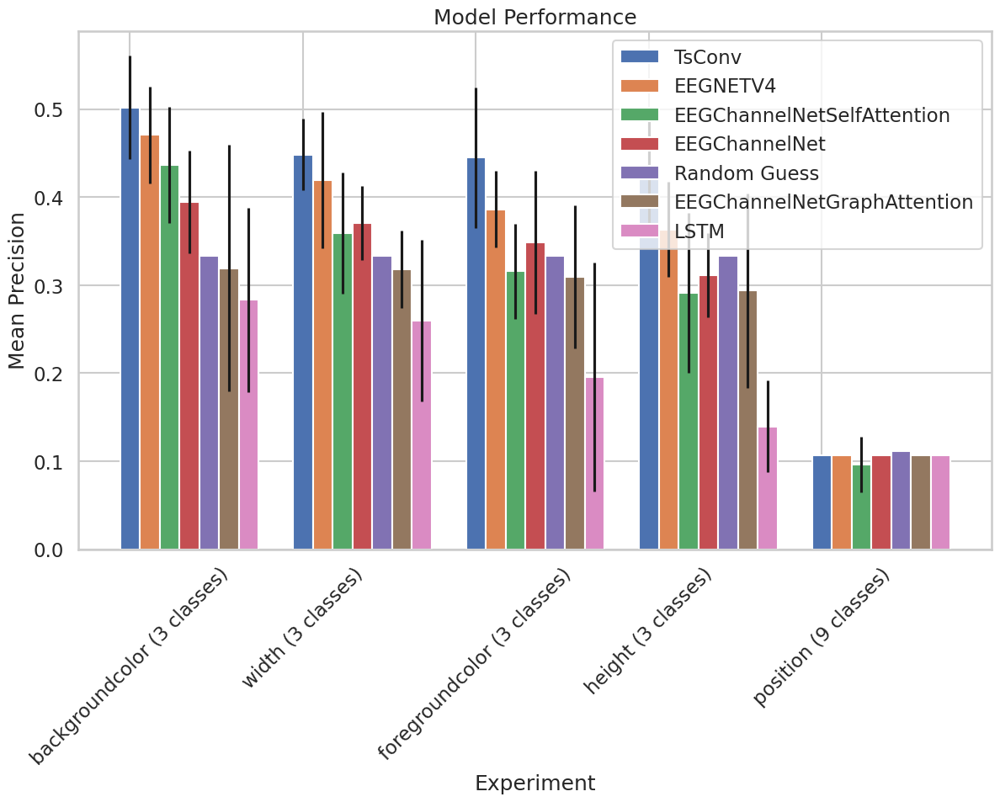

In [9]:
formated_results = {}


for subject, subject_result in enumerate(subject_results):
    for model, result in subject_result.items():
        for key, val in result.items():
            experiment = key + ' (' + str(num_of_classes[key]) + ' classes)'
            if (model, experiment) not in formated_results:
                formated_results[(model, experiment)] = {
                    'Model': model,
                    'Experiment': experiment,
                    'mean_precisions': []
                }
            formated_results[(model, experiment)]['mean_precisions'].append(val['mean_precision'])


for experiment, val in formated_results.items():
    formated_results[experiment]['sd_precision'] = np.std(val['mean_precisions'])
    formated_results[experiment]['mean_precision'] = np.mean(val['mean_precisions'])

overall_result_df = pd.DataFrame(formated_results).T
overall_result_df['Model'] = overall_result_df['Model']
overall_result_df['Experiment'] = overall_result_df['Experiment']
overall_result_df = overall_result_df.sort_values(by='mean_precision', ascending=False)
overall_result_df = overall_result_df.melt(id_vars=['Model', 'Experiment'], var_name='Metric', value_name='Value')

# Separate means and standard deviations
mean_df = overall_result_df[overall_result_df['Metric'].str.contains('mean')]
mean_df['Metric'] = mean_df['Metric'].str.replace('mean_', '')
sd_df = overall_result_df[overall_result_df['Metric'].str.contains('sd')]
sd_df['Metric'] = sd_df['Metric'].str.replace('sd_', '')

# Merge means and standard deviations
final_df = pd.merge(mean_df, sd_df, on=['Model', 'Experiment', 'Metric'])
final_df.columns = ['Model', 'Experiment', 'Metric', 'Mean Value', 'SD Value']

# Create the barplot with error bars
sns.set(style="whitegrid", context="talk")
plt.figure(figsize=(14, 8))

# Get the number of models and metrics
num_models = final_df['Model'].nunique()
num_experiments = final_df['Experiment'].nunique()

# Create an array for the x-axis locations
x = np.arange(num_experiments)

# Width of the bars
width = 0.8 / num_models

# For each metric, create a bar plot with error bars
for i, model in enumerate(final_df['Model'].unique()):
    # Filter the DataFrame for the current metric<
    df = final_df[final_df['Model'] == model]
    
    # Create the bar plot with error bars
    plt.bar(x + i * width, df['Mean Value'], width, yerr=df['SD Value'], label=model)

# Add labels, title, and legend
plt.xlabel('Experiment')
plt.ylabel('Mean Precision')
plt.title('Model Performance')
plt.xticks(x, final_df['Experiment'].unique())
plt.xticks(rotation=45)
plt.legend()

# Show the plot
plt.show()

## Object Channel Selection

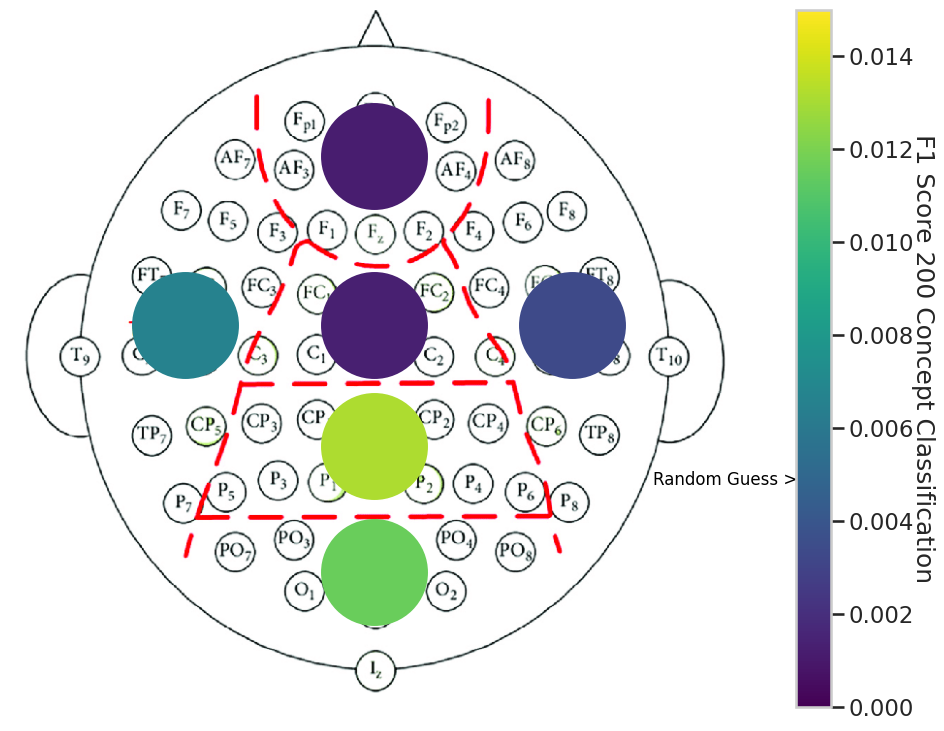

In [10]:
subject_results = [read_experiment_results('e8', subject=i) for i in range(2, 11)]
formated_results = {}
for i, subject_result in enumerate(subject_results):
    for key, val in subject_result.items():
        if key not in formated_results:
            formated_results[key] = {}
        for result in val['results']:
            if "all" in result["name"]:
                continue
            if f'mean_f1_{result["name"]}' not in formated_results[key]:
                formated_results[key][f'mean_f1_{result["name"]}'] = []
            formated_results[key][f'mean_f1_{result["name"]}'].append(result["result"]["mean_f1"])


for key, val in formated_results.items():
    for key2, val2 in val.items():
        formated_results[key][key2] = np.mean(val2)

formated_results_df = pd.DataFrame(formated_results).T
formated_results_df["Model"] = formated_results_df.index
formated_results_df = formated_results_df.melt(id_vars='Model', var_name='Experiment', value_name='Value')

eeg_image_path = "../../assets/eeg_image_head.png"

image = cv2.imread(eeg_image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Example points and corresponding heatmap values
eeg_center_labels = [experiment.split('f1_')[-1] for experiment in formated_results_df["Experiment"]]
eeg_centers = [(375, 325), (375, 150), (580, 325), (375, 580), (375, 450), (180, 325)]
eeg_values = formated_results_df["Value"]

# Step 2: Create a colormap
cmap = plt.cm.viridis  # Choose a colormap
norm = plt.Normalize(vmin=0, vmax=0.015)  # Normalize values to be between 0 and 1
colors = cmap(norm(eeg_values))  # Map values to colors

# Step 3: Plot the image using Matplotlib
fig, ax = plt.subplots(figsize=(12, 8))

ax.imshow(image)

# Step 4: Overlay points on the image with heatmap colors
for point, color in zip(eeg_centers, colors):
    ax.scatter(point[0], point[1], c=[color], s=5700)



# Add colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Only needed for Matplotlib < 3.1
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('F1 Score 200 Concept Classification', rotation=270, labelpad=15)

# Add random guess label at 0.05
ax.text(738, 485, 'Random Guess >', fontsize=12, color='black', ha='center', va='center')



# Show the plot with points overlayed
plt.tight_layout()
plt.axis('off')
plt.show()



## Reconstruction Results 

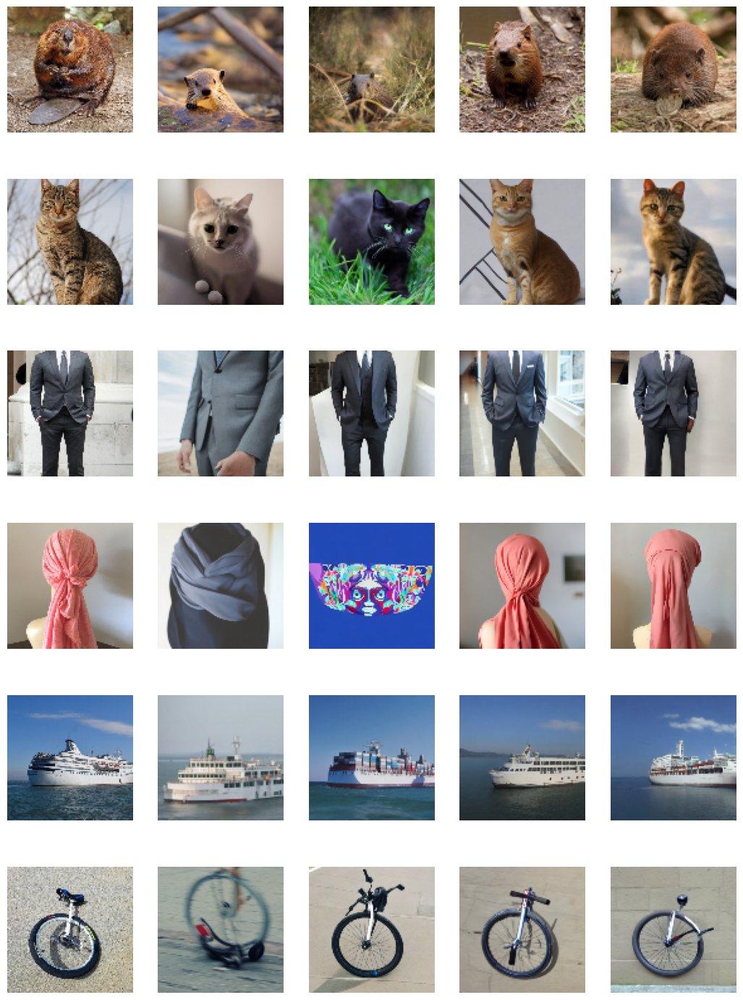

In [11]:
def read_image(image_path, size=(100, 100)):
    image = cv2.imread(str(image_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, size)
    return image


def plot_reconstruction_matrix(subject, img_class, idx, ax, mode='vis_ling_guided'):
    folder_path = Path(os.getenv("OUTPUT_FOLDER")) / f"decoded/e12_{subject}/"

    if mode == 'vis_ling_guided':
        img_path = Path(folder_path / f"img_mat_{img_class}_{idx}_vis_ling")
    elif mode == 'vis_guided':
        img_path = Path(folder_path / f"img_mat_{img_class}_{idx}_vis")
    elif mode == 'ling_guided':
        img_path = Path(folder_path / f"img_mat_{img_class}_{idx}_ling")

    img_all = read_image(img_path / "image_all.png")
    img_vis = read_image(img_path / "image_ling.png")
    img_ling = read_image(img_path / "image_vis.png")
    img_none = read_image(img_path / "image_none.png")
    original_img = read_image(img_path / "orig_img.png")


    ax[0].imshow(original_img)
    ax[0].axis('off')

    ax[1].imshow(img_all)
    ax[1].axis('off')

    ax[2].imshow(img_ling)
    ax[2].axis('off')

    ax[3].imshow(img_vis)
    ax[3].axis('off')

    ax[4].imshow(img_none)
    ax[4].axis('off')



    

    
rows = 6
cols = 5

fig, ax = plt.subplots(rows, cols, figsize=(cols * 3 - 2, rows * 3))
plot_reconstruction_matrix(1, 'animal', 1, ax[0])
plot_reconstruction_matrix(1, 'animal', 2, ax[1])
plot_reconstruction_matrix(1, 'clothing', 7, ax[2])
plot_reconstruction_matrix(1, 'clothing', 3, ax[3])
plot_reconstruction_matrix(1, 'vehicle', 5, ax[4])
plot_reconstruction_matrix(1, 'vehicle', 17, ax[5])


#ax[0, 0].set_title("Original", pad=20, fontsize=20, fontweight='bold')
#ax[0, 1].set_title("No EEG Decoding", pad=20, fontsize=20, fontweight='bold')
#ax[0, 2].set_title("Ling EEG Decoding", pad=20, fontsize=20, fontweight='bold')
#ax[0, 3].set_title("Vis EEG Decoding", pad=20, fontsize=20, fontweight='bold')
#ax[0, 4].set_title("All EEG Decoding", pad=20, fontsize=20, fontweight='bold')

plt.show()




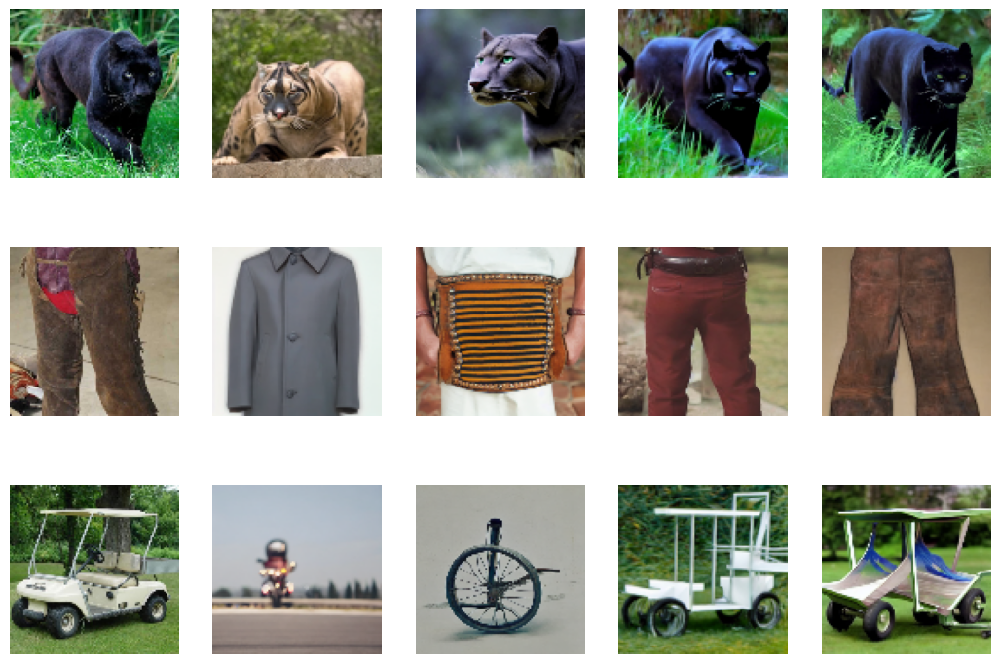

In [12]:
#negative cases

rows = 3
cols = 5

fig, ax = plt.subplots(rows, cols, figsize=(cols * 3 - 2, rows * 3))
plot_reconstruction_matrix(1, 'animal', 10, ax[0])
plot_reconstruction_matrix(1, 'clothing', 0, ax[1])
plot_reconstruction_matrix(1, 'vehicle', 7, ax[2])


#ax[0, 0].set_title("Original", pad=20, fontsize=20, fontweight='bold')
#ax[0, 1].set_title("No EEG Decoding", pad=20, fontsize=20, fontweight='bold')
#ax[0, 2].set_title("Ling EEG Decoding", pad=20, fontsize=20, fontweight='bold')
#ax[0, 3].set_title("Vis EEG Decoding", pad=20, fontsize=20, fontweight='bold'b)
#ax[0, 4].set_title("All EEG Decoding", pad=20, fontsize=20, fontweight='bold')

plt.show()

# Appendix plots

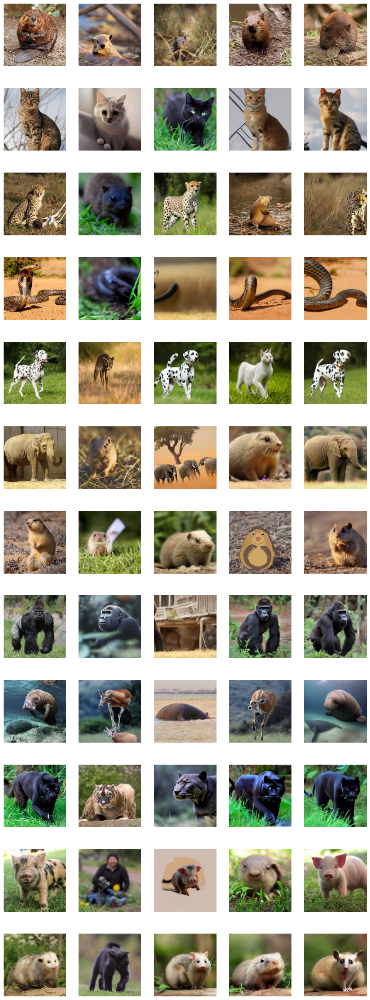

In [19]:
rows = 12
cols = 5

#Appendix plots
fig, ax = plt.subplots(rows, cols, figsize=(cols * 3 - 2, rows * 3))
plot_reconstruction_matrix(1, 'animal', 1, ax[0])
plot_reconstruction_matrix(1, 'animal', 2, ax[1])
plot_reconstruction_matrix(1, 'animal', 3, ax[2])
plot_reconstruction_matrix(1, 'animal', 4, ax[3])
plot_reconstruction_matrix(1, 'animal', 5, ax[4])
plot_reconstruction_matrix(1, 'animal', 6, ax[5])
plot_reconstruction_matrix(1, 'animal', 7, ax[6])
plot_reconstruction_matrix(1, 'animal', 8, ax[7])
plot_reconstruction_matrix(1, 'animal', 9, ax[8])
plot_reconstruction_matrix(1, 'animal', 10, ax[9])
plot_reconstruction_matrix(1, 'animal', 11, ax[10])
plot_reconstruction_matrix(1, 'animal', 12, ax[11])

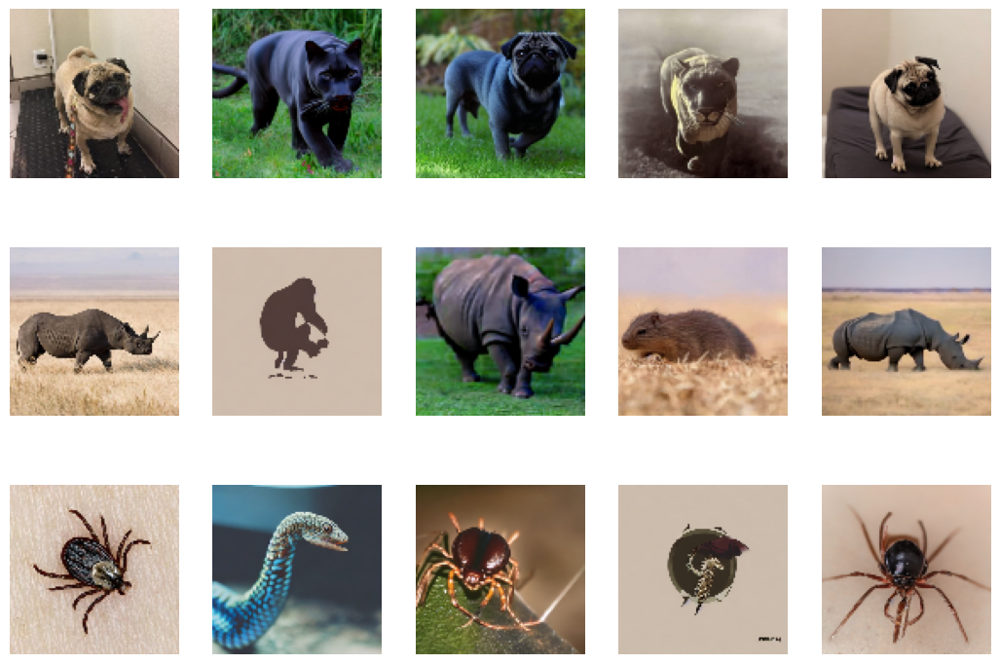

In [20]:
rows = 3
cols = 5

#Appendix plots
fig, ax = plt.subplots(rows, cols, figsize=(cols * 3 - 2, rows * 3))
plot_reconstruction_matrix(1, 'animal', 13, ax[0])
plot_reconstruction_matrix(1, 'animal', 14, ax[1])
plot_reconstruction_matrix(1, 'animal', 15, ax[2])

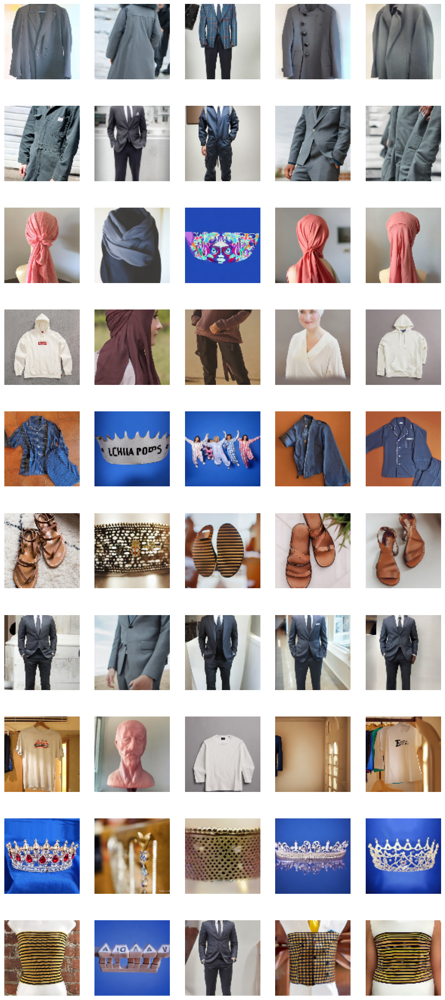

In [23]:
rows = 10
cols = 5

#Appendix plots
fig, ax = plt.subplots(rows, cols, figsize=(cols * 3 - 2, rows * 3))
plot_reconstruction_matrix(1, 'clothing', 1, ax[0])
plot_reconstruction_matrix(1, 'clothing', 2, ax[1])
plot_reconstruction_matrix(1, 'clothing', 3, ax[2])
plot_reconstruction_matrix(1, 'clothing', 4, ax[3])
plot_reconstruction_matrix(1, 'clothing', 5, ax[4])
plot_reconstruction_matrix(1, 'clothing', 6, ax[5])
plot_reconstruction_matrix(1, 'clothing', 7, ax[6])
plot_reconstruction_matrix(1, 'clothing', 8, ax[7])
plot_reconstruction_matrix(1, 'clothing', 9, ax[8])
plot_reconstruction_matrix(1, 'clothing', 10, ax[9])

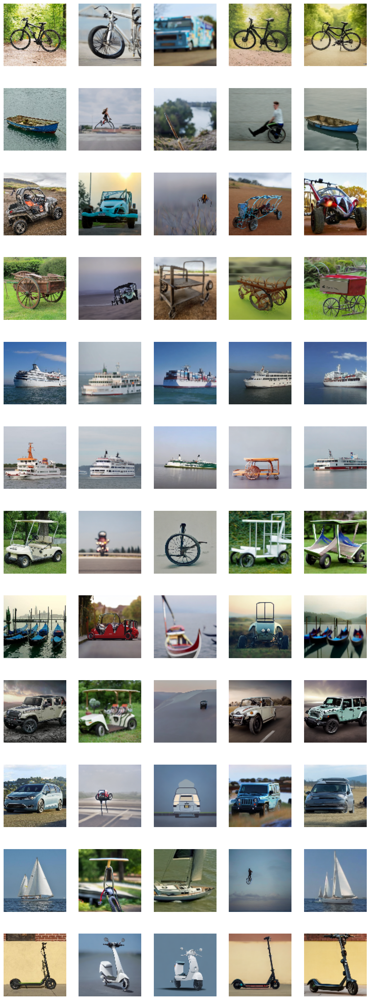

In [25]:
rows = 12
cols = 5

#Appendix plots
fig, ax = plt.subplots(rows, cols, figsize=(cols * 3 - 2, rows * 3))
plot_reconstruction_matrix(1, 'vehicle', 1, ax[0])
plot_reconstruction_matrix(1, 'vehicle', 2, ax[1])
plot_reconstruction_matrix(1, 'vehicle', 3, ax[2])
plot_reconstruction_matrix(1, 'vehicle', 4, ax[3])
plot_reconstruction_matrix(1, 'vehicle', 5, ax[4])
plot_reconstruction_matrix(1, 'vehicle', 6, ax[5])
plot_reconstruction_matrix(1, 'vehicle', 7, ax[6])
plot_reconstruction_matrix(1, 'vehicle', 8, ax[7])
plot_reconstruction_matrix(1, 'vehicle', 9, ax[8])
plot_reconstruction_matrix(1, 'vehicle', 10, ax[9])
plot_reconstruction_matrix(1, 'vehicle', 11, ax[10])
plot_reconstruction_matrix(1, 'vehicle', 12, ax[11])

[ WARN:0@617.442] global /io/opencv/modules/imgcodecs/src/loadsave.cpp (239) findDecoder imread_('/home/matterj/codebases/eeg_image_reconstruction/output/decoded/e12_1/img_mat_vehicle_19_vis_ling/image_all.png'): can't open/read file: check file path/integrity


error: OpenCV(4.6.0) /io/opencv/modules/imgproc/src/color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


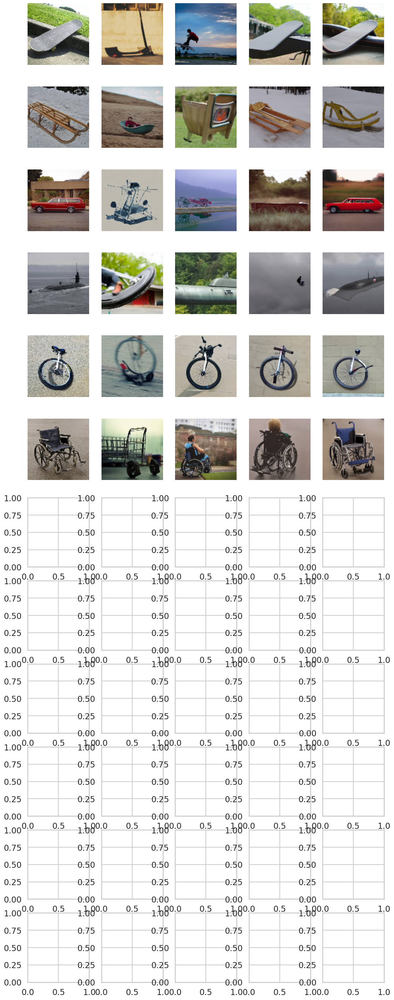

In [27]:
rows = 6
cols = 5

#Appendix plots
fig, ax = plt.subplots(rows, cols, figsize=(cols * 3 - 2, rows * 3))
plot_reconstruction_matrix(1, 'vehicle', 13, ax[0])
plot_reconstruction_matrix(1, 'vehicle', 14, ax[1])
plot_reconstruction_matrix(1, 'vehicle', 15, ax[2])
plot_reconstruction_matrix(1, 'vehicle', 16, ax[3])
plot_reconstruction_matrix(1, 'vehicle', 17, ax[4])
plot_reconstruction_matrix(1, 'vehicle', 18, ax[5])